# Antarctic coastal blooms project 

Code by Rachel Ha (rachelh9@uw.edu) and Ethan Campbell (ethancc@uw.edu)

*Conda/Mamba environment name: coastal_blooms*

## To do

#### High priorities:

#### To do in revisions:
- Figure out how to remove the vertical line at -180°/180° (within Ross Sea) in Fig. 1 and Fig. 3
- Figure out how to speed up the calculation of 'sst_open_water' variable from ERA5 SST in other notebook (currently takes ~9 hours and throws some "IOPub message rate exceeded" warnings)
- Consider assessing impacts of cloud contamination by comparing daily OC-CCI Chl with daily SIC (not possible with monthly OC-CCI data)
- Consider adding inset plots to Fig. 3, focused on 1-2 well-studied specific polynyas in Amundsen/Bellingshausen vs. East Antarctica

#### Possible additions:
- Consider adding proxy for upwelling: zonal wind speed is likely too crude, especially due to variable orientation relative to coastline and turning angle of ice-ocean stress, so consider obtaining/deriving upwelling velocity from GLORYS
- Consider adding light data: either PAR data set (from GlobColour or CERES) or ERA5 downwelling irradiance (note for Ethan: also potentially useful for Song Sangmin's use of PAR as a model predictor for delta-pCO2; see Desktop for 1-2 days of downloaded test data for GlobColour PAR and various ERA5 downwelling irradiance options)
- Scatter plot or 2D histogram of interannual changes in ice-free days vs. Chl, to assess whether the relationship between the two is linear or flattens out eventually (non-linear)

## Preamble

In [546]:
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
import os
import requests
import calendar
from scipy import stats, ndimage, io
from scipy.interpolate import griddata
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.path as mpath
from netCDF4 import Dataset
import xarray as xr
import xesmf
import xskillscore as xs
import dask
from dask.diagnostics import ProgressBar
from pyproj import Transformer
import cartopy as cartopy
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import cmocean as cm
from glob import glob
from bs4 import BeautifulSoup
import copernicusmarine

In [886]:
# function for plotting
def map_circle_boundary():
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta),np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    return circle

load_ice_shelves = True
if load_ice_shelves:
    ice_shelves = cartopy.feature.NaturalEarthFeature('physical','antarctic_ice_shelves_polys','50m')
    ice_shelves_lines = cartopy.feature.NaturalEarthFeature('physical','antarctic_ice_shelves_lines','50m')

# add basic Cartopy map features
def setup_map(axs,plot_idx=None,remove_labels=False,remove_180=False,continent_only=False,land_color=0.75):
    if plot_idx is None:
        ax = axs
    else:
        ax = axs[plot_idx]
    ax.set_extent([-180,180,-90,-60],crs=ccrs.PlateCarree())
    ax.set_boundary(map_circle_boundary(),transform=ax.transAxes)
    if continent_only:
        ax.spines['geo'].set_visible(False)
        ax.set_axis_off()
    if not continent_only: ax.add_feature(cfeature.OCEAN.with_scale('50m'),color='0.95',zorder=1)
    ax.add_feature(cfeature.LAND.with_scale('50m'),color=str(land_color),zorder=2)
    ax.coastlines(resolution='50m',linewidth=0.5,zorder=3)
    ax.add_feature(ice_shelves,facecolor=str(land_color+0.075),edgecolor='none',zorder=4)
    ax.add_feature(ice_shelves_lines,facecolor='none',edgecolor='k',linestyle='-',linewidth=0.5,zorder=5)
    if continent_only:
        pass
    elif remove_180:
        gl1 = ax.gridlines(crs=ccrs.PlateCarree(),draw_labels=False,ylim=[-75,-50],alpha=0.25,ylocs=[],zorder=6)
        gl1_labels = ax.gridlines(crs=ccrs.PlateCarree(),draw_labels=True,ylim=[-75,-50],alpha=0.0,
                                  xlocs=[-120,-60,0,60,120],ylocs=[],zorder=6)
    elif remove_labels:
        gl1 = ax.gridlines(crs=ccrs.PlateCarree(),draw_labels=False,ylim=[-75,-50],alpha=0.25,ylocs=[],zorder=6)
    else:
        gl1 = ax.gridlines(crs=ccrs.PlateCarree(),draw_labels=True,ylim=[-75,-50],alpha=0.25,ylocs=[],zorder=6)
    if not continent_only: gl2 = ax.gridlines(crs=ccrs.PlateCarree(),draw_labels=False,alpha=0.25,xlocs=[],ylocs=None,zorder=6)

# function for beautifying plots with only x- and y-axes showing (and with slight offsets)
def drop_spines(ax=None,left=True,hide_bottom=False):
    if ax == None: ax = plt.gca()
    if left: ax.spines['left'].set_position(('outward',5))
    else:    ax.spines['right'].set_position(('outward',5))
    ax.spines['bottom'].set_position(('outward',5))
    if hide_bottom: ax.spines['bottom'].set_visible(False) 
    ax.spines['top'].set_visible(False)
    if left: ax.spines['right'].set_visible(False)
    else:    ax.spines['left'].set_visible(False)

In [924]:
# specify file paths
data_dir = '/dat1/ethancc/Data/Coastal blooms project/'
data_dir_processed = data_dir + 'Processed/'
data_dir_results = data_dir + 'Figures/'
etopo_dir = data_dir + 'ETOPO/'
chl_dir = data_dir + 'OC_CCI/'
chl_orig_dir = chl_dir + 'Original_files/'
chl_regridded_dir = chl_dir + 'Regridded/'
sic_dir = data_dir + 'NSIDC_CDR/'
sic_orig_dir = sic_dir + 'CDR_v6/'
sic_regridded_dir = sic_dir + 'Regridded_to_ERA5_CDR_v6/'
era5_dir = data_dir + 'ERA5/'
era5_monthly_dir = era5_dir + 'ERA5_monthly_means/'
basal_melt_dir = data_dir + 'Ice_shelf_melt/'
tamsitt_2021_dir = data_dir + 'Residence_time/'
glorys_dir = data_dir + 'GLORYS12V1/'
polynya_dir = data_dir + 'Coastal_polynyas/'
lin_2024_dir = polynya_dir + 'SIC60_6.25km_20d/'

# input data
etopo_filepath = etopo_dir + 'ETOPO_2022_v1_60s_N90W180_surface.nc'
era5_grid_filepath = era5_dir + 'era5_grid.nc'
basal_melt_filepath = basal_melt_dir + 'NSIDC-0792_19920317-20171216_V01.0.nc'
tamsitt_filepath = tamsitt_2021_dir + 'SHELF_0009_sigma3243256_pxy_shelf_2dfields_notransport.npz'

## Download, load, and process data

In [1275]:
# load various data sets
etopo = xr.open_dataset(etopo_filepath)
measures_data = xr.open_dataset(basal_melt_filepath)
polynya_data = io.loadmat(lin_2024_dir + 'OverviewMap.mat')
polynya_grid = xr.open_dataset(lin_2024_dir + 'LonLat.nc').rename({'Lat':'lat','Lon':'lon'})
era5_grid = xr.open_dataset(era5_grid_filepath)
era5 = xr.open_mfdataset(era5_monthly_dir + '*.nc').rename({'lats':'lat','lons':'lon'})

### Download and regrid GLORYS data

In [1277]:
# download, regrid, and load CMEMS GLORYS12V1 ocean reanalysis monthly MLD data
# - note: download routine requires Copernicus account (username/password)
download_glorys = False
regrid_glorys = False

if download_glorys:
    os.chdir(glorys_dir)
    copernicusmarine.subset(dataset_id='cmems_mod_glo_phy_my_0.083deg_P1M-m',variables=['mlotst'],
                            minimum_longitude=-180,maximum_longitude=180,
                            minimum_latitude=-80,maximum_latitude=-50,
                            start_datetime='1993-01-01T00:00:00',
                            end_datetime='2026-05-01T00:00:00')

if regrid_glorys:
    # load data file (~1 GB)
    glorys = xr.open_dataset(glorys_dir + 'cmems_mod_glo_phy_my_0.083deg_P1M-m_mlotst_180.00W-179.92E_80.00S-50.00S_1993-01-01-2026-05-01.nc')

    # create regridders for regridding to ERA5 grid
    glorys_grid = xr.Dataset({'lat':(['lat'],glorys['latitude'].values),
                              'lon':(['lon'],glorys['longitude'].values)})
    glorys_era5_regridder = xesmf.Regridder(glorys_grid,era5_grid,'bilinear',
                                            filename=glorys_dir + 'regridder_glorys_era5.nc',reuse_weights=True)

    # regrid data
    glorys_on_era5_grid = glorys_era5_regridder(glorys['mlotst'])
    glorys_on_era5_grid.rename('mld').to_netcdf(glorys_dir + 'GLORYS12V1_199301_202605_regridded_ERA5.nc')

# load regridded data
glorys = xr.open_dataset(glorys_dir + 'GLORYS12V1_199301_202605_regridded_ERA5.nc')

### Process ETOPO data and create shelf mask

In [6]:
# process ETOPO bathymetry data
reprocess_etopo = False

if reprocess_etopo:
    etopo_south = etopo.sel(lat=slice(-80,-60))
    etopo_era5_regridder = xesmf.Regridder(etopo_south[['lat','lon']],era5_grid,'bilinear',
                                           filename=(etopo_dir + 'regridder_etopo_era5.nc'),reuse_weights=False)
    etopo_on_era5_grid = etopo_era5_regridder(etopo['z'].sel(lat=slice(-80,-60)))
    etopo_on_era5_grid = etopo_on_era5_grid.rename('z')
    etopo_mask = (etopo_on_era5_grid > -1000) & (etopo_on_era5_grid < 0)

    # exclude South Orkney Islands from shelf mask
    lat_mask = np.logical_and(etopo_mask['lat'] >= -65, etopo_mask['lat'] <= -60)
    lon_mask = np.logical_and(etopo_mask['lon'] >= -50, etopo_mask['lon'] <= -30)
    etopo_mask = xr.where(lat_mask & lon_mask,0.0,etopo_mask)
    etopo_mask = etopo_mask.rename('z')

    # export regridded data and shelf mask
    etopo_on_era5_grid.to_netcdf(etopo_dir + 'etopo_regridded_era5.nc')
    etopo_mask.to_netcdf(etopo_dir + 'etopo_shelf_mask.nc')
    
# load bathymetry mask
etopo_on_era5_grid = xr.open_dataset(etopo_dir + 'etopo_regridded_era5.nc')
etopo_on_era5_grid.loc[dict(lon=-180)] = etopo_on_era5_grid.loc[dict(lon=-179.75)]   # fill in missing strip along dateline
etopo_mask = xr.open_dataset(etopo_dir + 'etopo_shelf_mask.nc')

# create version of bathymetry with South Orkney Islands set to out-of-range value
lat_etopo_era5 = np.logical_and(etopo_on_era5_grid['lat'] >= -65, etopo_on_era5_grid['lat'] <= -60)
lon_etopo_era5 = np.logical_and(etopo_on_era5_grid['lon'] >= -50, etopo_on_era5_grid['lon'] <= -30)
etopo_outline = xr.where(lat_etopo_era5 & lon_etopo_era5,-100000,etopo_on_era5_grid)

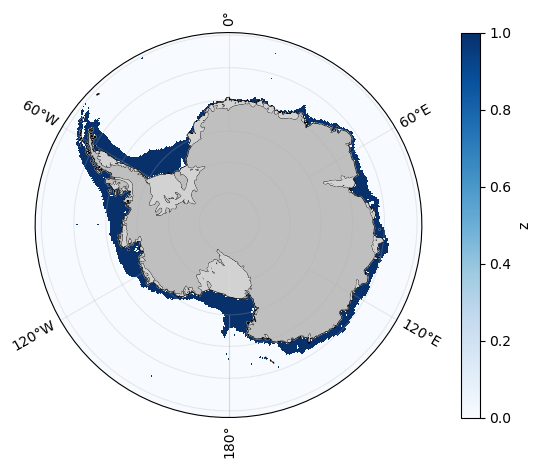

In [9]:
# test plot for initial shelf mask
fig = plt.figure(figsize=[10,5])
ax = plt.axes(projection=ccrs.SouthPolarStereo()) 
setup_map(ax)
etopo_mask['z'].plot(ax=ax,cmap='Blues',transform=ccrs.PlateCarree());

In [8]:
# create outer shelf mask
# - identifies the Antarctic continental shelf as the largest connected component with bathymetry values shallower than 1000 m
# - a binary dilation algorithm was used to expand the shelf outline outwards by one 1/4° grid cell to enable connections between areas
#   where the shelf is too narrow to be resolved after regridding to the ERA5 grid
# - also includes isolated areas with deeper bathymetry within the shelf boundary

# connected component mask
outer_shelf_mask = ((etopo_on_era5_grid > -1000) & (etopo_on_era5_grid < 200))
outer_shelf_mask = xr.where(np.logical_or(outer_shelf_mask['lat'] >= -60,outer_shelf_mask['lat'] <= -80),False,outer_shelf_mask)
outer_shelf_mask_labeled, num_features = ndimage.label(outer_shelf_mask['z'])
main_idx = np.argmax(ndimage.sum(outer_shelf_mask['z'],outer_shelf_mask_labeled,range(num_features + 1)))
outer_shelf_mask_values = (outer_shelf_mask_labeled == main_idx)
outer_shelf_mask['z'][:] = outer_shelf_mask_values

# fill isolated deeper areas
outer_shelf_mask['z'][:] = ndimage.binary_fill_holes(outer_shelf_mask['z'])

# expand shelf outline and remove land areas
outer_shelf_mask['z'][:] = ndimage.binary_dilation(outer_shelf_mask['z'],iterations=1)
outer_shelf_mask = outer_shelf_mask & (etopo_on_era5_grid < 0)
outer_shelf_mask['z'][:] = ndimage.binary_fill_holes(outer_shelf_mask['z'])   # fill any new holes created by dilation

# add land areas for visualization purposes (so only outer shelf contour is shown; inner contour will be hidden under continent
outer_shelf_mask = np.logical_or(outer_shelf_mask,(etopo_on_era5_grid >= 0))
outer_shelf_mask = xr.where(outer_shelf_mask['lat'] >= -60,False,outer_shelf_mask)

# exclude islands
outer_shelf_mask_labeled, num_features = ndimage.label(outer_shelf_mask['z'])
main_idx = np.argmax(ndimage.sum(outer_shelf_mask['z'],outer_shelf_mask_labeled,range(num_features + 1)))
outer_shelf_mask_values = (outer_shelf_mask_labeled == main_idx)
outer_shelf_mask['z'][:] = outer_shelf_mask_values

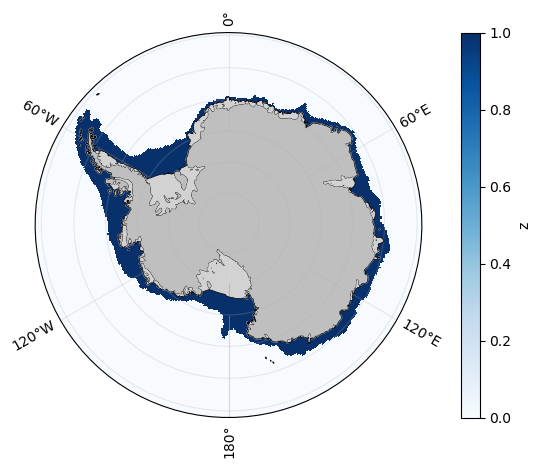

In [10]:
# test plot for finalized outer shelf mask
fig = plt.figure(figsize=[10,5])
ax = plt.axes(projection=ccrs.SouthPolarStereo()) 
setup_map(ax)
outer_shelf_mask['z'].plot(ax=ax,cmap='Blues',transform=ccrs.PlateCarree());

### Process OC-CCI data and create bloom mask

In [11]:
# regrid OC-CCI chlorophyll data to ERA5 grid
regrid_chl = False
reuse_regridder = True

if regrid_chl:
    os.chdir(chl_dir)
    for filename in os.listdir(chl_orig_dir):
        print(f'Working on {filename}...')
        skip_folder = ['oc_regridded','.Spotlight-V100']
        if filename in skip_folder or not filename.endswith('.nc'): 
            continue
        filepath = os.path.join(chl_orig_dir,filename)
        orig_data = xr.open_dataset(filepath)
        cci_era5_regridder = xesmf.Regridder(orig_data.sel(lat=slice(-49,-81))[['lat','lon']],era5_grid,'bilinear',
                                             filename='regridder_cci_era5.nc',reuse_weights=reuse_regridder)
        reuse_regridder = True   # reuse saved regridder for subsequent years
        cci_on_era5_grid = cci_era5_regridder(orig_data['chlor_a'].sel(lat=slice(-49,-81)))
        cci_on_era5_grid = cci_on_era5_grid.rename('chlor_a')
        yyyymm = filename[-15:-9]
        date = pd.to_datetime(yyyymm,format='%Y%m')
        new_filename = f'oc_{date.strftime('%Y%m')}.nc'
        new_filepath = os.path.join(chl_regridded_dir,new_filename) 
        cci_on_era5_grid.to_netcdf(new_filepath) 

In [12]:
# load regridded OC-CCI chlorophyll data
chl_orig = xr.open_mfdataset(chl_regridded_dir + '*.nc')

# fill missing data to enable analysis of 1997-1998 bloom year:
#    OC-CCI monthly record starts on 1997-09-04, but we include the July 1997-June 1998 bloom year by treating 1997-07 and 1997-08 as
#    uniformly missing values over the domain of interest (south of 60°S) due to polar night, which is almost entirely accurate
chl_all_nan = chl_orig.sel(time=slice('1998-07','1998-08')).copy()
chl_all_nan['chlor_a'][:] = np.nan
chl_all_nan['time'] = np.array([datetime(1997,7,1),datetime(1997,8,1)])
chl_orig = xr.concat([chl_all_nan,chl_orig],dim='time')
chl_orig_time = chl_orig['time'].values.copy()
chl_orig_time[2] = np.datetime64('1997-09-01')
chl_orig = chl_orig.assign_coords(time=chl_orig_time)

# truncate to period of interest, in case more recent data is available
chl_orig = chl_orig.sel(time=slice('1997-07-01','2026-06-30'))

# fill grid cells with missing data for that month (due to cloud cover, ice cover, or lack of light) with a value of zero chlorophyll
chl = chl_orig.fillna(0.0)

# create climatology
chl_average = chl.mean(dim='time')

In [1255]:
# create "coastal bloom mask" representing connected areas of high annual average chlorophyll
#   (above a subjective threshold of 0.15 mg/m3) that overlap with the continental shelf
#   and are poleward of the northernmost extent of the shelf (60.75°S)
#   - note: exclude isolated labeled bloom regions containing 5 or fewer grid cells and fill interior areas of lower average Chl
recreate_mask = False

if recreate_mask:
    # step 1: create mask by applying threshold to annual average Chl (see below for testing plot)
    chl_average_masked = xr.where((chl_average['chlor_a'] > 0.15),chl_average['chlor_a'],np.nan)
    
    # step 2: exclude areas not overlapping with the continental shelf and areas containing only 1-2 grid cells
    high_chl_all_mask = (~chl_average_masked.isnull())
    high_chl_all_mask = xr.where(high_chl_all_mask['lat'] > -60.75,False,high_chl_all_mask)
    high_chl_mask_labeled, num_features = ndimage.label(high_chl_all_mask)
    high_chl_shelf_labels = np.unique(high_chl_mask_labeled[outer_shelf_mask['z']])
    label_idx_to_exclude = np.where(np.isin(ndimage.sum(high_chl_all_mask,high_chl_mask_labeled,range(num_features + 1)),[1,2,3,4,5]))[0]
    high_chl_shelf_labels = high_chl_shelf_labels[~np.isin(high_chl_shelf_labels,np.append(label_idx_to_exclude,0))]
    bloom_mask = np.isin(high_chl_mask_labeled,high_chl_shelf_labels)
    bloom_mask_temp = high_chl_all_mask.copy()
    bloom_mask_temp[:] = bloom_mask
    bloom_mask = bloom_mask_temp
    bloom_mask[:] = ndimage.binary_fill_holes(bloom_mask)
    
    # save bloom mask to netCDF file
    bloom_mask.rename('bloom_mask').to_netcdf(data_dir_processed + 'bloom_mask.nc')

# load saved mask
bloom_mask = xr.open_dataset(data_dir_processed + 'bloom_mask.nc')['bloom_mask']

In [1257]:
# calculate annual average Chl for use in time series and correlation analyses
# - note: times are assigned to start of the July-June year, i.e., 1998-07-01 for 1998-07-01 to 1999-06-30
recalculate_chl_annual_averages = False

if recalculate_chl_annual_averages:
    chl_annual_averages = chl.resample(time='YS-JUL').mean(dim='time').transpose('lat','lon','time')
    chl_non_zero_filled_annual_averages = chl_orig.resample(time='YS-JUL').mean(dim='time').transpose('lat','lon','time')
    
    chl_annual_averages.to_netcdf(chl_dir + 'chl_annual_averages.nc')
    chl_non_zero_filled_annual_averages.to_netcdf(chl_dir + 'chl_non_zero_filled_annual_averages.nc')

chl_annual_averages = xr.open_dataset(chl_dir + 'chl_annual_averages.nc')['chlor_a']
chl_non_zero_filled_annual_averages = xr.open_dataset(chl_dir + 'chl_non_zero_filled_annual_averages.nc')['chlor_a']

[########################################] | 100% Completed | 56.57 s


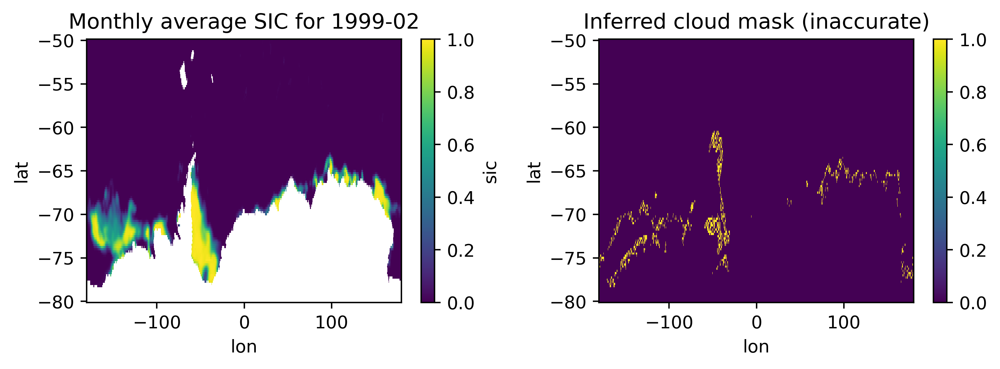

In [1264]:
# try to assess approximate cloudy pixel count during bloom periods (December–February), 
#    based on grid cell monthly averages where original OC-CCI is NaN and ice-free days ≥ 1
reprocess_cloud_analysis = False

if reprocess_cloud_analysis:
    sic = xr.open_mfdataset(sic_regridded_dir + '*.nc',combine='nested',concat_dim='time')   # takes 2-3 minutes
    with ProgressBar():
        ice_free_days_monthly = (sic['sic'] < 0.15).resample(time='MS').sum().sel(time=slice('1997-07-01','2026-06-01')).compute()
    cloud_presence = (chl_orig['chlor_a'].isnull() & ice_free_days_monthly > 0)
    cloud_presence_bloom_periods = cloud_presence.sel(time=cloud_presence['time.month'].isin([12,1,2]))
    cloud_presence_annual = cloud_presence_bloom_periods.resample(time='YS-JUL').sum().transpose('lat','lon','time')
    cloud_presence_annual.rename('cloud_month_count').to_netcdf(data_dir_processed + 'cloud_presence_annual.nc')

# reload processed data
cloud_presence_annual = xr.open_dataset(data_dir_processed + 'cloud_presence_annual.nc')['cloud_month_count']

# CONCLUSION: estimating cloud contamination (distinct from sea ice cover) is not possible using the monthly OC-CCI record,
#     because the resulting cloud masks appear to mostly reflect the borders around areas of sea ice, likely representing 
#     sub-monthly sea ice variability that results in an invalid monthly OC-CCI estimate despite average monthly SIC < 0.15
# - note to self: I tested the new Ford et al. (2026) cloud-gap-filled OC-CCI product, and it appears to generate so much
#     spurious chlorophyll in areas of sea ice cover that it is likely unusable as a solution for this analysis

# example plot
plt.figure(figsize=(8,3),facecolor='w',dpi=400)
plt.subplot(1,2,1)
sic['sic'].sel(time='1999-02').mean(dim='time').plot()
plt.title('Monthly average SIC for 1999-02')
plt.subplot(1,2,2)
cloud_presence.isel(time=7).plot()
plt.title('Inferred cloud mask (inaccurate)')
plt.tight_layout()

### Process coastal polynya data

In [1266]:
# process Lin et al. (2024) boundaries of "typical" coastal polynyas
# - the criteria selected here are a >20% probability of >10 days of persistent open water (<60% SIC), 
#   on a moving window basis from April to October
polynyas = polynya_grid[['lat','lon']].copy()
polynyas['polynyas'] = (('y','x'),polynya_data['OverviewMap'].T)

# retain only coastal polynyas (those with even-numbered IDs)
polynyas['polynyas'][:] = np.logical_and(polynyas['polynyas'] % 2 == 0, polynyas['polynyas'] > 0)

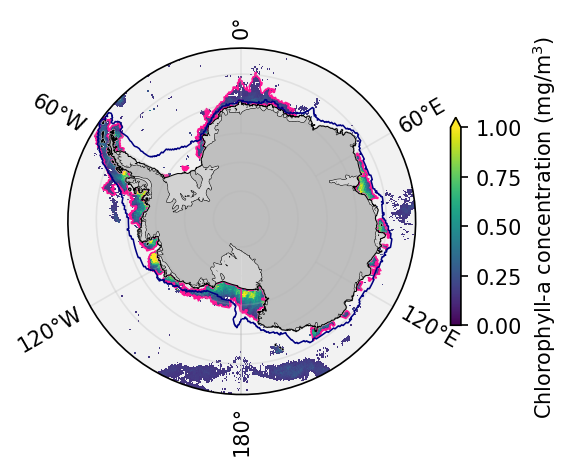

In [1267]:
# plot illustrating threshold value of annual average Chl and shelf overlap assessment
fig, ax = plt.subplots(figsize=(6,3),facecolor='w',dpi=150,subplot_kw={'projection':ccrs.SouthPolarStereo()})
setup_map(ax)
chl_average_masked.plot(ax=ax,cmap='viridis',vmin=0.0,vmax=1.0,
                        cbar_kwargs={'label':'Chlorophyll-a concentration (mg/m$^3$)','shrink':0.6,'extend':'max'},
                        transform=ccrs.PlateCarree())
outer_shelf_mask['z'].plot.contour(ax=ax,levels=[0.5],colors='navy',linewidths=0.75,transform=ccrs.PlateCarree(),zorder=8)
bloom_mask.plot.contour(ax=ax,levels=[0.5],colors='deeppink',linewidths=0.75,transform=ccrs.PlateCarree(),zorder=1);

### Process basal melt data

In [1268]:
# expand ice shelf basal melt grid coordinates to enable Gaussian filtering
reprocess_basal_melt_grid = False

if reprocess_basal_melt_grid:
    # existing coordinates and spacing
    x = measures_data['x'].values
    y = measures_data['y'].values
    dx = np.unique(np.diff(measures_data['x'].values)).item()   # spacing is 1920 meters, consistent with documentation
    
    # calculate how many grid cells to use for grid padding
    pad_km = 1000
    pad_cells = int((pad_km * 1000) / dx)
    print('Adding this many cells to every edge: ',pad_cells)
    
    # create new coordinates with padding on either end
    x_new = np.arange(x.min() - pad_cells * dx,
                      x.max() + (pad_cells + 1) * dx,
                      dx)
    y_new = np.arange(y.min() - pad_cells * dx,
                      y.max() + (pad_cells + 1) * dx,
                      dx)
    
    # reindex onto padded coordinate grid, filling newly missing values with 0.0
    paolo_melt_expanded = measures_data['melt'].reindex(x=x_new,y=y_new,fill_value=0.0)
    
    # export to file (note: this output is 186 MB; processing/export took ~5 minutes)
    paolo_melt_expanded.to_netcdf(basal_melt_dir + 'Paolo_ice_shelves_melt_expanded.nc')

# load from file
paolo_melt_expanded = xr.open_dataset(basal_melt_dir + 'Paolo_ice_shelves_melt_expanded.nc')['melt']

In [1269]:
# Gaussian-filter ice shelf basal melt data
# - note: specify sigma = 156 grid cells = ~300 km (given grid cell length of 1920 m), selected to encompass the
#         width of the Antarctic continental shelf, including major off-shelf blooms, in all circumpolar areas
# - note: as additional justification for sigma value, the average Antarctic shelf width is 125 km,
#         based on Friedlander et al. (2020)
reprocess_basal_melt_gaussian = False

if reprocess_basal_melt_gaussian:
    # fill NaN values with 0.0 (no basal melt) ahead of Gaussian filtering
    measures_data_zero = xr.where(paolo_melt_expanded.isnull(), 0.0, paolo_melt_expanded)
    
    # set values of positive basal melt (i.e., ice sheet thickening/accretion) to zero, truncating the data range
    measures_data_zero = xr.where(measures_data_zero > 0.0, 0.0, measures_data_zero)
    
    # Gaussian-filter the grid-expanded basal melt data
    # - note: this takes 5 mins per year and produces 26 files, each ~240 MB and representing one year
    for year in np.unique(measures_data_zero['time'].dt.year):
        print(f'Working on year {year}')
        smoothed_one_year = measures_data_zero.sel(time=str(year)).groupby('time').map(ndimage.gaussian_filter,sigma=156)
        smoothed_one_year = smoothed_one_year.rename('melt_gaussian')
        smoothed_one_year.to_netcdf(basal_melt_dir + f'Gaussian_filtered/basalmelt_gaussian_{year}.nc')

# load filtered basal melt data
smoothed_all = xr.open_mfdataset(basal_melt_dir + 'Gaussian_filtered/*.nc')
basal_melt_gaussian = smoothed_all['melt_gaussian']

In [1270]:
# regrid Gaussian-filtered, grid-expanded basal melt data to ERA5 grid
regrid_basal_melt_gaussian = False
reuse_basal_melt_regridder = True

if regrid_basal_melt_gaussian:    
    # build 2D grids of projected coordinates
    X, Y = np.meshgrid(basal_melt_gaussian['x'].values,basal_melt_gaussian['y'].values)
    
    # transform from EPSG:3031 to EPSG:4326 (lon/lat)
    tfm = Transformer.from_crs('EPSG:3031','EPSG:4326',always_xy=True)
    lon2d, lat2d = tfm.transform(X,Y)
    basal_gaussian_grid = basal_melt_gaussian.assign_coords(lon=(('y','x'),lon2d),
                                                            lat=(('y','x'),lat2d))
    ds_in = xr.Dataset({'lat':basal_gaussian_grid['lat'],
                        'lon':basal_gaussian_grid['lon']})
    ds_out = xr.Dataset({'lat':era5_grid['lat'],
                         'lon':era5_grid['lon']})

    # save lat/lon from expanded grid (used later for plotting purposes)
    ds_in.to_netcdf(basal_melt_dir + 'Paolo_expanded_grid.nc')
    
    # create regridder object (note: it takes a long time to regenerate these weights)
    regridder = xesmf.Regridder(ds_in,ds_out,'bilinear',filename=(basal_melt_dir + 'regridder_Paolo_expanded_ERA5.nc'),
                                reuse_weights=reuse_basal_melt_regridder)
    
    # regrid basal melt data and export
    basal_melt = regridder(basal_gaussian_grid)
    with ProgressBar():
        basal_melt.to_netcdf(basal_melt_dir + 'Paolo_basal_melt_gaussian_regridded_era5.nc',compute=True)

# load Gaussian-filtered, ERA5-regridded ice shelf basal melt data set
# - note: any positive values, representing accretion, have already been truncated
# - note: provided dates represent the start dates of each quarter
basalmelt = xr.open_dataset(basal_melt_dir + 'Paolo_basal_melt_gaussian_regridded_era5.nc')['__xarray_dataarray_variable__']
basalmelt = basalmelt.rename('basal_melt')

# change dates to represent the end dates of each quarter
basalmelt['time'] = basalmelt['time'] + np.timedelta64(int(np.round(30.44*3)),'D')

# change polarity such that positive values represent melt (now lower bound of data is 0.0)
basal_melt_pos = basalmelt * -1

# crop time dimension to represent only relevant data for analysis
# - relevant time period of OC-CCI Chl record: July 1997 to June 2026
# - available basal melt data record: quarter from 1992-03-17 (listed start date) to 1992-06, to the 
#                                     quarter from 2017-12-16 (listed end date) to 2018-03
# - common period between the two records: 1997-06 (quarter end date 1997-09) to 2018-03
# - extended period, including 12 additional months at start of basal melt record to accommodate shelf water 
#   residence time window: 1996-12 (quarter end date 1997-03) to 2018-03
basal_melt_pos = basal_melt_pos.sel(time=slice('1997-03','2018-03'))   # slice based on end dates

In [1271]:
# prep original, grid-expanded basal melt data and calculate average field for plotting purposes only
prep_basal_melt_plotting = False

if prep_basal_melt_plotting:
    # fill NaN values with 0.0 (no basal melt)
    measures_data_zero = xr.where(paolo_melt_expanded.isnull(), 0.0, paolo_melt_expanded)
    
    # set values of positive basal melt (i.e., ice sheet thickening/accretion) to zero, truncating the data range
    measures_data_zero = xr.where(measures_data_zero > 0.0, 0.0, measures_data_zero)
    
    # load lat/lon grid values
    paolo_expanded_grid = xr.open_dataset(basal_melt_dir + 'Paolo_expanded_grid.nc')
    
    # add lat/lon to data
    measures_data_zero['lat'] = paolo_expanded_grid['lat']
    measures_data_zero['lon'] = paolo_expanded_grid['lon']

    # crop time dimension to represent only relevant data for analysis (1997-01 to 2018-03; see above)
    # - note: this time dimension still uses quarter-start dates
    measures_data_zero = measures_data_zero.sel(time=slice('1996-12','2017-12'))

    # calculate average over relevant time period
    basal_melt_average = measures_data_zero.mean(dim='time')

    # save updated data file
    basal_melt_average.to_netcdf(basal_melt_dir + 'Paolo_average_basal_melt_on_expanded_grid.nc')

# load from file
basal_melt_average = xr.open_dataset(basal_melt_dir + 'Paolo_average_basal_melt_on_expanded_grid.nc')['melt']

### Process shelf water residence time data and apply to basal melt

In [1272]:
# load and process Circumpolar Deep Water (CDW) residence time data from Tamsitt et al. (2021), Fig. 1a
regrid_residence_time = False

# regrid to ERA5 grid
if regrid_residence_time:
    # load data
    cdw_mean_age_b = np.load(tamsitt_filepath)['pxy_shelf_cdw_xy_meanage_b']
    cdw_mean_age_b = np.flip(np.flip(cdw_mean_age_b.T,axis=1),axis=1)
    
    # based on study code provided by V. Tamsitt
    tamsitt_lon = np.arange(0+0.5/2,360+0.5/2,0.5)
    tamsitt_lat = np.arange(-80+0.25/2,-55+0.25/2,0.25)
    
    # compile into xarray object
    tamsitt = xr.DataArray(data=cdw_mean_age_b.T,
                           dims=['lon','lat'],
                           coords=dict(lon=(['lon'],tamsitt_lon),
                                       lat=(['lat'],tamsitt_lat)),
                           attrs=dict(description='CDW residence time from Tamsitt et al. (2021), Fig. 1a',units='days'))
    
    # regrid Tamsitt data to ERA5 grid
    tamsitt_grid = xr.Dataset({'lon':(['lon'],tamsitt['lon'].values),
                               'lat':(['lat'],tamsitt['lat'].values)})
    tamsitt_era5_regridder = xesmf.Regridder(tamsitt_grid,era5_grid,'bilinear',
                                             filename=(tamsitt_2021_dir + 'regridder_CDW_residence_time_ERA5.nc'),
                                             reuse_weights=False)
    with ProgressBar(): tamsitt_on_era5_grid = tamsitt_era5_regridder(tamsitt)
    tamsitt_on_era5_grid = xr.where(tamsitt_on_era5_grid == 0.0,np.nan,tamsitt_on_era5_grid)  # mask areas outside original data area
    
    # export regridded data
    tamsitt_on_era5_grid.to_netcdf(tamsitt_2021_dir + 'Tamsitt_2021_CDW_residence_time_regridded_ERA5.nc')

# load regridded data
tamsitt_on_era5_grid = xr.open_dataset(tamsitt_2021_dir + 'Tamsitt_2021_CDW_residence_time_regridded_ERA5.nc')['__xarray_dataarray_variable__']

# calculate CDW residence time on the shelf (meridionally-averaged), linearly interpolating over small gaps in longitude
tamsitt_meridional_mean_with_nans = tamsitt_on_era5_grid.mean(dim='lat',skipna=True)
tamsitt_meridional_mean = tamsitt_meridional_mean_with_nans.interpolate_na(dim='lon',method='linear')

# convert to a time window in quarters (intervals of 3 months = 3 * 30.44 days = 91.32 days) for rolling mean calculation
# - note: also clip lower bound to value of 1 quarter
tamsitt_average_window_quarters = (tamsitt_meridional_mean / 91.32).round().clip(min=1,max=4)

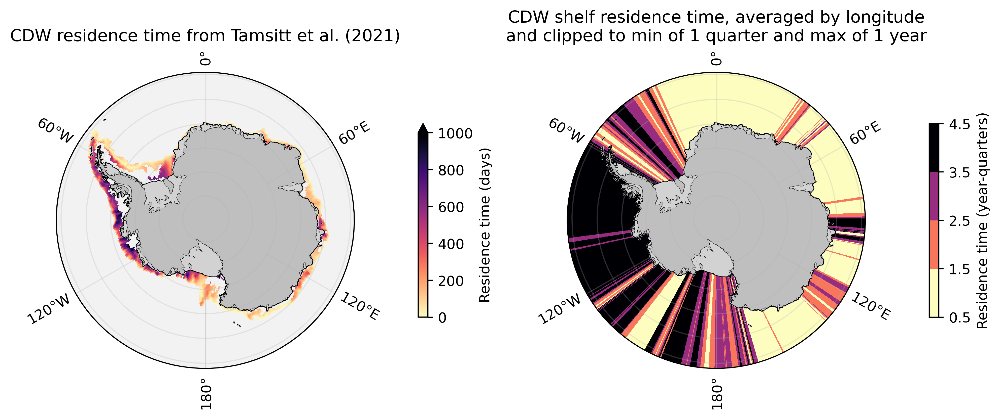

In [237]:
# plot illustrating CDW residence time data after processing

# make plots    
nrows = 1; ncols = 2; figsize = (12,5)
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,subplot_kw={'projection':ccrs.SouthPolarStereo()},
                        figsize=figsize,facecolor='w',dpi=400)
axs = axs.flatten()

setup_map(axs[0])
tamsitt_on_era5_grid.plot(ax=axs[0],cmap='magma_r',vmin=0,vmax=1000,transform=ccrs.PlateCarree(),
                          cbar_kwargs={'shrink':0.5,'pad':0.15,'label':'Residence time (days)'})
axs[0].set_title('CDW residence time from Tamsitt et al. (2021)');

setup_map(axs[1])
cmap = plt.get_cmap('magma_r',8)
tamsitt_average_window_quarters_gridded.transpose('lat','lon').plot(ax=axs[1],cmap=cmap,vmin=0.5,vmax=4.5,transform=ccrs.PlateCarree(),
                                                                    norm=mcolors.BoundaryNorm(np.arange(0.5,5.5,1),cmap.N),
                                                                    cbar_kwargs={'shrink':0.5,'pad':0.15,'label':'Residence time (year-quarters)'})
axs[1].set_title('CDW shelf residence time, averaged by longitude\nand clipped to min of 1 quarter and max of 1 year');

In [1273]:
# calculate average basal melt using location-dependent time averaging windows
# - outputs basal melt with original quarter-end time dimension, representing averages over past N quarters
basal_melt_cumulative_sum = basal_melt_pos.cumulative(dim='time').sum()
end_time_idx_vec = xr.DataArray(np.arange(len(basal_melt_pos['time'])),dims='time',coords={'time':basal_melt_pos['time']})
start_time_idx_gridded = (end_time_idx_vec - tamsitt_average_window_quarters_gridded).clip(min=0)   # subtraction broadcasts to lat/lon dimensions
start_time_idx_gridded_prep = start_time_idx_gridded.astype(int).transpose('time','lat','lon')
start_time_idx_gridded_prep = start_time_idx_gridded_prep.rename(time='window_end')  # to avoid conflict between two 'time' dimensions
basal_melt_cumulative_sum.isel(time=start_time_idx_gridded_prep).drop_vars('time').rename({'window_end':'time'})
basal_melt_location_dependent_sum = basal_melt_cumulative_sum - basal_melt_cumulative_sum.isel(time=start_time_idx_gridded_prep).drop_vars('time').rename({'window_end':'time'})
actual_window_length_quarters_gridded = end_time_idx_vec - start_time_idx_gridded    # subtraction broadcasts to lat/lon dimensions again
basal_melt_location_dependent_mean = basal_melt_location_dependent_sum / actual_window_length_quarters_gridded

# for correlation analyses, calculate annual average ice shelf basal melt prior to bloom periods
# - note: use the average basal melt culminating in the two quarters ending in mid-December (September-December) and mid-March (December-March)
# - note: this yields annual averages for 21 bloom years, from 1997-1998 to 2017-2018
basal_melt_bloom = basal_melt_location_dependent_mean.sel(time=basal_melt_location_dependent_mean['time.month'].isin([12,3]))
basal_melt_bloom_averages = basal_melt_bloom.resample(time='YS-JUL').mean().transpose('lat','lon','time').sel(time=slice('1997',None))

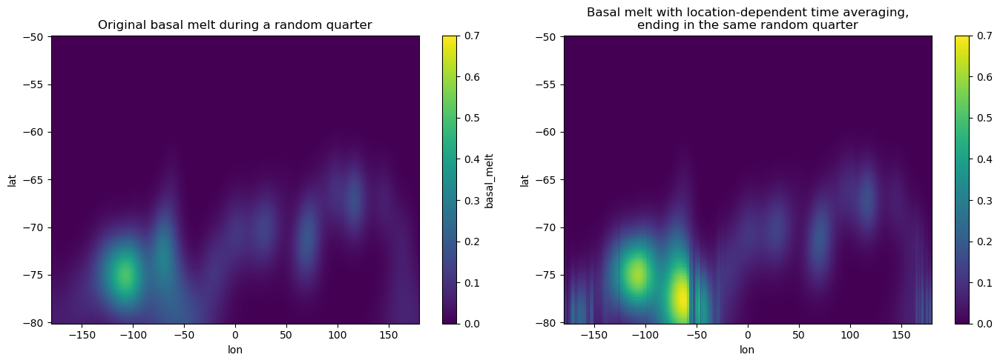

In [1274]:
# plot illustrating comparison between basal melt with and without location-dependent time averaging 
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
basal_melt_pos.isel(time=31).plot(vmax=0.7)
plt.title('Original basal melt during a random quarter')
plt.subplot(1,2,2)
basal_melt_location_dependent_mean.isel(time=31).plot(vmax=0.7)
plt.title('Basal melt with location-dependent time averaging,\nending in the same random quarter');
plt.tight_layout()

### Process ERA5 data

In [1276]:
# process ERA5 data
era5 = era5.sel(time=slice('1997-07-01','2026-06-30'))

# subset to relevant months and calculate averages
# - note: "bloom years" are considered to be July-June (July to the following June)
# - note: "during blooms" is considered to be December-February, the months of highest coastal polynya productivity
#         (per Arrigo et al. 2003)
# - note: "winter" is considered to be July-November, prior to the bloom months

# 10-m wind speed during winter
ws10_winter = era5['si10'].sel(time=era5['time.month'].isin([7,8,9,10,11]))
ws10_winter_averages = ws10_winter.resample(time='YS-JUL').mean().transpose('lat','lon','time')

# 10-m wind speed during bloom periods
ws10_bloom = era5['si10'].sel(time=era5['time.month'].isin([12,1,2]))
ws10_bloom_averages = ws10_bloom.resample(time='YS-JUL').mean().transpose('lat','lon','time')

# SST during blooms (during periods of open water only)
# - SST was masked to NaN when daily SIC ≥ 0.15 (using NSIDC CDR) to represent only ice-free SSTs and remove the direct signal of ice presence
sst_bloom = era5['sst_open_water'].sel(time=era5['time.month'].isin([12,1,2]))
sst_bloom_averages = sst_bloom.resample(time='YS-JUL').mean().transpose('lat','lon','time')

### Process GLORYS data

In [1278]:
# process GLORYS12V1 ocean reanalysis data for mixed layer depth (MLD)
# - note: currently downloaded data only goes to 2026-05, but that's fine because 2026-06 is not included in "winter" or "blooms" periods
glorys = glorys.sel(time=slice('1997-07-01','2026-06-30'))

# subset to relevant months and calculate averages
# - note: "bloom years" are considered to be July-June (July to the following June)
# - note: "during blooms" is considered to be December-February, the months of highest coastal polynya productivity
#         (per Arrigo et al. 2003)
# - note: "winter" is considered to be July-November, prior to the bloom months

# maximum (deepest) MLD during winter
mld_winter = glorys['mld'].sel(time=glorys['time.month'].isin([7,8,9,10,11]))
mld_winter_maximums = mld_winter.resample(time='YS-JUL').max().transpose('lat','lon','time')

# MLD during bloom periods
mld_bloom = glorys['mld'].sel(time=glorys['time.month'].isin([12,1,2]))
mld_bloom_averages = mld_bloom.resample(time='YS-JUL').mean().transpose('lat','lon','time')

### Process sea ice concentration data

In [1279]:
reprocess_ice_free_days = True

# load sea ice concentration data and compute ice-free days by year
# - note: use criterion of SIC = 15% for ice coverage
if reprocess_ice_free_days:
    sic = xr.open_mfdataset(sic_regridded_dir + '*.nc',combine='nested',concat_dim='time')   # takes 2-3 minutes
    with ProgressBar():
        ice_free_days = (sic['sic'] < 0.15).resample(time='YS-JUL').sum().sel(time=slice('1997','2025')).compute()
    ice_free_days.to_netcdf(data_dir_processed + 'ice_free_days.nc')

# load processed annual ice-free days
ice_free_days = xr.open_dataset(data_dir_processed + 'ice_free_days.nc')['sic'].transpose('lat','lon','time')

[########################################] | 100% Completed | 52.77 s


### Correlation analyses

In [1280]:
# mask predictor variables using bloom mask (see above) and calculate spatial correlations
# - note on variable sign: positive MLD = deeper MLs; positive basal melt = more basal melt
recalc_corrs = False

# function to calculate Spearman correlation using the original scipy.stats.spearmanr() implementation, to get around 
#    apparent bug in xskillscore's (faster) implementation of xs.spearman_r(skipna=True) that causes it to yield NaN values
#    when even a few time values at a certain grid cell are NaN, unlike in xs.pearson_r(skipna=True)
#    (this only seemed to affect the sst_open_water variable, since it has NaN values during ice cover)
def spearman_r_scipy(a,b,dim='time',skipna=True,output='r'):
    def _spearman(x,y):
        if skipna:
            valid = np.isfinite(x) & np.isfinite(y)
            x = x[valid]
            y = y[valid]
        if len(x) < 2:  # scipy requires at least 2 observations
            return np.nan
        if output == 'r':   return stats.spearmanr(x,y,nan_policy='omit').statistic
        elif output == 'p': return stats.spearmanr(x,y,nan_policy='omit').pvalue
    return xr.apply_ufunc(_spearman,a,b,input_core_dims=[[dim],[dim]],output_core_dims=[[]],vectorize=True,
                          dask='parallelized',output_dtypes=[float])

if recalc_corrs:
    masked_chl_annual_averages = xr.where(bloom_mask,chl_annual_averages,np.nan).compute()
    print(f'Chlorophyll: {chl_annual_averages['time'].size} bloom years available')
    def masked_spearman(chl_corrs,predictor_data,name,label_short,label_long,use_alt_implementation=False):
        common_time_range = [np.maximum(predictor_data['time'].min(),masked_chl_annual_averages['time'].min()),
                             np.minimum(predictor_data['time'].max(),masked_chl_annual_averages['time'].max())]
        predictor_data_subset = predictor_data.sel(time=slice(*common_time_range)).chunk(dict(time=-1))
        chl_data_subset = masked_chl_annual_averages.sel(time=slice(*common_time_range))
        masked_predictor_data = xr.where(bloom_mask,predictor_data_subset,np.nan)
        if use_alt_implementation:
            r = spearman_r_scipy(masked_predictor_data,chl_data_subset,dim='time',skipna=True,output='r').rename('r')
            p = spearman_r_scipy(masked_predictor_data,chl_data_subset,dim='time',skipna=True,output='p').rename('p')
        else:
            r = xs.spearman_r(masked_predictor_data,chl_data_subset,dim='time',skipna=True).rename('r')
            p = xs.spearman_r_p_value(masked_predictor_data,chl_data_subset,dim='time',skipna=True).rename('p')
        chl_corrs[f'r_{name}'] = (('lat','lon'),r.values)
        chl_corrs[f'p_{name}'] = (('lat','lon'),p.values)
        chl_corrs[f'r_{name}'].attrs['predictor_name_short'] = label_short
        chl_corrs[f'r_{name}'].attrs['predictor_name_long'] = label_long
        chl_corrs[f'r_{name}'].attrs['n_bloom_years'] = predictor_data_subset['time'].size
        chl_corrs[f'p_{name}'].attrs['predictor_name'] = label_long
    
    # calculate and save spatial correlations
    chl_corrs = bloom_mask.copy().to_dataset()
    masked_spearman(chl_corrs,ice_free_days,'ice_free_days',
                    'Ice-free days','Annual ice-free days')
    masked_spearman(chl_corrs,sst_bloom_averages,'sst_bloom',
                    'SST (bloom average)','Ice-free sea surface temperature (bloom average)',use_alt_implementation=True)
    masked_spearman(chl_corrs,ws10_winter_averages,'ws10_winter',
                    'Wind speed (winter average)','Wind speed (winter average)')
    masked_spearman(chl_corrs,ws10_bloom_averages,'ws10_bloom',
                    'Wind speed (bloom average)','Wind speed (bloom average)')
    masked_spearman(chl_corrs,mld_winter_maximums,'mld_max_winter',
                    'MLD (winter maximum)','Mixed layer depth (winter maximum)')
    masked_spearman(chl_corrs,mld_bloom_averages,'mld_bloom',
                    'MLD (bloom average)','Mixed layer depth (bloom average)')
    masked_spearman(chl_corrs,basal_melt_bloom_averages,'basal_melt',
                    'Basal melt (preceding bloom)','Ice shelf basal melt (preceding bloom)')
    
    # save to netCDF file
    chl_corrs.to_netcdf(data_dir_processed + 'chl_corrs.nc')

# load from file
chl_corrs = xr.open_dataset(data_dir_processed + 'chl_corrs.nc')
for var_name in chl_corrs.data_vars:
    if var_name[0] == 'r':
        print(f'{chl_corrs[var_name].attrs['predictor_name_short']}: {chl_corrs[var_name].attrs['n_bloom_years']} bloom years included')

Chlorophyll: 29 bloom years available


/tmp/ipykernel_184309/1884223825.py:17: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  if output == 'r':   return stats.spearmanr(x,y,nan_policy='omit').statistic
/tmp/ipykernel_184309/1884223825.py:18: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  elif output == 'p': return stats.spearmanr(x,y,nan_policy='omit').pvalue


Ice-free days: 29 bloom years included
SST (bloom average): 29 bloom years included
Wind speed (winter average): 29 bloom years included
Wind speed (bloom average): 29 bloom years included
MLD (winter maximum): 29 bloom years included
MLD (bloom average): 29 bloom years included
Basal melt (preceding bloom): 21 bloom years included


In [1281]:
# statistics on correlations
print(f'For ice-free day correlations, number of longitude grid cells with rho > 0.5: {(chl_corrs['r_ice_free_days'].mean(dim='lat') > 0.5).sum().item()}')
print(f'For ice-free day correlations, number of longitude grid cells with rho < 0.5: {(chl_corrs['r_ice_free_days'].mean(dim='lat') < 0.5).sum().item()}')
print(f'Average rho values for winter wind speed and winter max MLD: rho = {chl_corrs['r_ws10_winter'].weighted(chl_corrs['lat']).mean().item():.2f} and {chl_corrs['r_mld_max_winter'].weighted(chl_corrs['lat']).mean().item():.2f}')

For ice-free day correlations, number of longitude grid cells with rho > 0.5: 584
For ice-free day correlations, number of longitude grid cells with rho < 0.5: 451
Average rho values for winter wind speed and winter max MLD: rho = -0.10 and -0.05


## Figure 1: blooms, polynyas, and basal melt

Note for figure caption: contour lines represent standard deviation, with interval = 0.01 m yr-1 and outermost line = 0.01 m yr-1


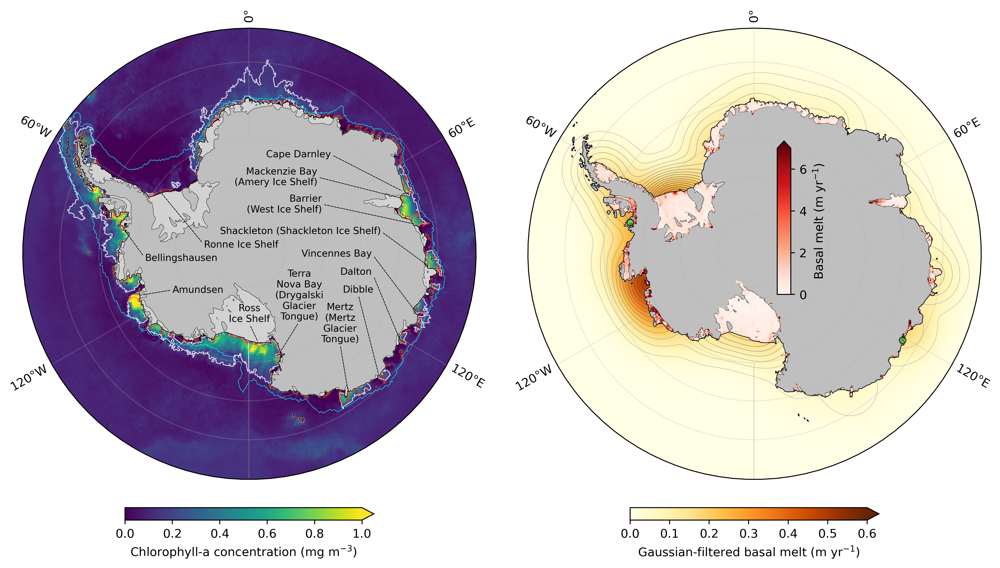

In [1282]:
# plot for paper showing:
# - Fig. 1a: coastal bloom areas, continental shelf, coastal polynya boundaries, coastal polynya and ice shelf names
# - Fig. 1b: ice shelf basal melt rate, Gaussian-filtered basal melt variable,
#   standard deviation of Gaussian-filtered basal melt, and markers for two ice shelves in Supp. Fig. for basal melt time series

nrows = 1; ncols = 2; figsize = (15,8.5)
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,subplot_kw={'projection':ccrs.SouthPolarStereo()},
                        gridspec_kw=dict(wspace=0.015,hspace=0.16),figsize=figsize,facecolor='w',dpi=400)
axs = axs.flatten()

# left subplot
ax = axs[0]
setup_map(ax,remove_180=True)
chl_average['chlor_a'].plot(ax=ax,cmap='viridis',vmin=0.0,vmax=1.0,
                            cbar_kwargs={'label':'Chlorophyll-a concentration (mg m$^{-3}$)','shrink':0.5,'extend':'max',
                                         'pad':0.05,'location':'bottom'},
                            transform=ccrs.PlateCarree())
outer_shelf_mask['z'].plot.contour(ax=ax,levels=[0.5],colors='aqua',linewidths=0.5,transform=ccrs.PlateCarree(),alpha=0.8,zorder=8)
bloom_mask.plot.contour(ax=ax,levels=[0.5],colors='w',linewidths=0.75,transform=ccrs.PlateCarree(),alpha=0.8,zorder=1)
ax.contour(polynyas['lon'],polynyas['lat'],polynyas['polynyas'],levels=[0.5],colors='orangered',alpha=0.8,linewidths=0.5,
           transform=ccrs.PlateCarree(),zorder=1);

transform = ccrs.PlateCarree()._as_mpl_transform(ax)
def annotate(text,lonlat,xytext,anchor_pos):
    if   anchor_pos == 'left':   va = 'center'; ha = 'left';   relpos = (0,0.5)
    elif anchor_pos == 'right':  va = 'center'; ha = 'right';  relpos = (1,0.5)
    elif anchor_pos == 'top':    va = 'top';    ha = 'center'; relpos = (0.5,1)
    elif anchor_pos == 'bottom': va = 'bottom'; ha = 'center'; relpos = (0.5,0)
    ax.annotate(text,xy=lonlat,xycoords=transform,xytext=(xytext[0],1-xytext[1]),textcoords='axes fraction',fontsize=8,
            va=va,ha=ha,arrowprops=dict(arrowstyle='-',lw=0.5,ls='--',facecolor='black',shrinkA=0.05,relpos=relpos),zorder=12);

annotate('Amundsen',(-112,-74),(0.33,0.58),'left')
annotate('Bellingshausen',(-80,-73),(0.27,0.51),'left')
annotate('Ronne Ice Shelf',(-56,-75.5),(0.40,0.48),'left')
annotate('Cape Darnley',(69,-68),(0.68,0.28),'right')
annotate('Mackenzie Bay\n(Amery Ice Shelf)',(71,-68.5),(0.65,0.33),'right')
annotate('Barrier\n(West Ice Shelf)',(81,-67.5),(0.66,0.39),'right')
annotate('Shackleton (Shackleton Ice Shelf)',(95,-66),(0.79,0.45),'right')
annotate('Vincennes Bay',(110,-66.5),(0.77,0.50),'right')
annotate('Dalton',(121,-66.5),(0.77,0.54),'right')
annotate('Dibble',(134,-66),(0.74,0.59),'bottom')
annotate('Mertz\n(Mertz\nGlacier\nTongue)',(145,-67),(0.70,0.70),'bottom')
annotate('Terra\nNova Bay\n(Drygalski\nGlacier\nTongue)',(164,-75.5),(0.61,0.65),'bottom')
annotate('Ross\nIce Shelf',(174,-77.5),(0.50,0.655),'bottom')

# right subplot
# - note: main processing time comes from plotting <basal_melt_average>
ax = axs[1]
setup_map(ax,remove_180=True)
cbar_ax = ax.inset_axes([0.55,0.41,0.03,0.34])    # [left, bottom, width, height] within subplot
pcm = ax.pcolormesh(basal_melt_average['lon'],basal_melt_average['lat'],
                    -1*xr.where(basal_melt_average == 0.0,np.nan,basal_melt_average).values,
                    vmin=0.0,vmax=7.0,cmap='Reds',zorder=4,transform=ccrs.PlateCarree())
plt.colorbar(pcm,cax=cbar_ax,label='Basal melt (m yr$^{-1}$)',extend='max')
basal_melt_pos.mean(dim='time').plot(ax=ax,cmap='YlOrBr',vmin=0.0,vmax=0.6,
                                     cbar_kwargs={'label':'Gaussian-filtered basal melt (m yr$^{-1}$)','shrink':0.5,'extend':'max',
                                                  'pad':0.05,'location':'bottom'},
                                     transform=ccrs.PlateCarree())
print('Note for figure caption: contour lines represent standard deviation, with interval = 0.01 m yr-1 and outermost line = 0.01 m yr-1')
base_cmap = plt.get_cmap('Greys')
upper_half_colors = base_cmap(np.linspace(0.4,1.0,128))
truncated_cmap = mcolors.LinearSegmentedColormap.from_list('upper_half',upper_half_colors)
cont_set = basal_melt_pos.std(dim='time').plot.contour(ax=ax,vmin=0.0,cmap=truncated_cmap,linewidths=0.35,
                                                       levels=np.arange(0.0+0.01,0.2,0.01),zorder=1,
                                                       transform=ccrs.PlateCarree())
ax.scatter(-77,-73,s=30,marker='o',c='limegreen',edgecolors='k',zorder=5,alpha=0.65,transform=ccrs.PlateCarree())
ax.scatter(121,-67,s=30,marker='o',c='limegreen',edgecolors='k',zorder=5,alpha=0.65,transform=ccrs.PlateCarree());

plt.savefig(data_dir_results + 'fig1.jpg',bbox_inches='tight')

## Figure 2: time series (and correlations)

In [1283]:
# grid cell weights, varying by latitude
lat_weights = np.cos(np.deg2rad(bloom_mask['lat']))

# latitude-weighted, annually averaged time series masked to shelf
land_mask = sst_bloom_averages.isel(time=0).isnull()
ts_chl_annual_averages_shelf = xr.where((outer_shelf_mask['z'] & ~land_mask),chl_annual_averages,np.nan).weighted(lat_weights).mean(dim=['lat','lon'])

# latitude-weighted, annually averaged time series masked to bloom areas
ts_chl_annual_averages = xr.where(bloom_mask,chl_annual_averages,np.nan).weighted(lat_weights).mean(dim=['lat','lon'])
ts_chl_non_zero_filled_annual_averages = xr.where(bloom_mask,chl_non_zero_filled_annual_averages,np.nan).weighted(lat_weights).mean(dim=['lat','lon'])
ts_ice_free_days = xr.where(bloom_mask,ice_free_days,np.nan).weighted(lat_weights).mean(dim=['lat','lon'])
ts_sst_bloom_averages = xr.where(bloom_mask,sst_bloom_averages,np.nan).weighted(lat_weights).mean(dim=['lat','lon'])
ts_ws10_winter_averages = xr.where(bloom_mask,ws10_winter_averages,np.nan).weighted(lat_weights).mean(dim=['lat','lon'])
ts_ws10_bloom_averages = xr.where(bloom_mask,ws10_bloom_averages,np.nan).weighted(lat_weights).mean(dim=['lat','lon'])
ts_mld_winter_maximums = xr.where(bloom_mask,mld_winter_maximums,np.nan).weighted(lat_weights).mean(dim=['lat','lon'])
ts_mld_bloom_averages = xr.where(bloom_mask,mld_bloom_averages,np.nan).weighted(lat_weights).mean(dim=['lat','lon'])
ts_basal_melt_bloom_averages = xr.where(bloom_mask,basal_melt_bloom_averages,np.nan).weighted(lat_weights).mean(dim=['lat','lon'])

# correlations
df = pd.concat([ts_chl_annual_averages.to_series().rename('Chl'),
                ts_chl_non_zero_filled_annual_averages.to_series().rename('Chl (non-filled)'),
                ts_chl_annual_averages_shelf.to_series().rename('Chl (shelf)'),
                ts_ice_free_days.to_series().rename('Ice-free days'),
                ts_sst_bloom_averages.to_series().rename('Bloom SST'),
                ts_ws10_winter_averages.to_series().rename('Winter wind'),
                ts_mld_winter_maximums.to_series().rename('Winter MLD'),
                ts_ws10_bloom_averages.to_series().rename('Bloom wind'),
                ts_mld_bloom_averages.to_series().rename('Bloom MLD'),
                ts_basal_melt_bloom_averages.to_series().rename('Basal melt')],
               axis=1)
corr = df.corr(method='spearman')
display(corr)

# linear regression
def linear(ds):
    dt = ds['time'].values
    dt_numeric = (dt - dt[0]) / np.timedelta64(1,'D')
    m, b, r, p, std = stats.linregress(dt_numeric,ds.values)
    return m.item(), b.item(), r.item(), p.item(), std.item(), dt_numeric

,Chl,Chl (non-filled),Chl (shelf),Ice-free days,Bloom SST,Winter wind,Winter MLD,Bloom wind,Bloom MLD,Basal melt
Chl,1.000000,0.827586,0.912315,0.696552,0.593596,-0.092611,-0.355172,0.360591,0.229557,0.037662
Chl (non-filled),0.827586,1.000000,0.751724,0.366010,0.303941,-0.030049,-0.251232,0.437438,0.234975,0.150649
Chl (shelf),0.912315,0.751724,1.000000,0.599015,0.596552,-0.081281,-0.397044,0.229064,0.070443,-0.172727
Ice-free days,0.696552,0.366010,0.599015,1.000000,0.654187,0.000985,-0.423153,0.364532,0.295074,0.248052
Bloom SST,0.593596,0.303941,0.596552,0.654187,1.000000,-0.248768,-0.456158,-0.103941,-0.120690,0.088312
Winter wind,-0.092611,-0.030049,-0.081281,0.000985,-0.248768,1.000000,0.246305,0.215764,0.284236,-0.225974
Winter MLD,-0.355172,-0.251232,-0.397044,-0.423153,-0.456158,0.246305,1.000000,-0.134483,0.354680,-0.245455
Bloom wind,0.360591,0.437438,0.229064,0.364532,-0.103941,0.215764,-0.134483,1.000000,0.719704,0.188312
Bloom MLD,0.229557,0.234975,0.070443,0.295074,-0.120690,0.284236,0.354680,0.719704,1.000000,0.224675
Basal melt,0.037662,0.150649,-0.172727,0.248052,0.088312,-0.225974,-0.245455,0.188312,0.224675,1.000000


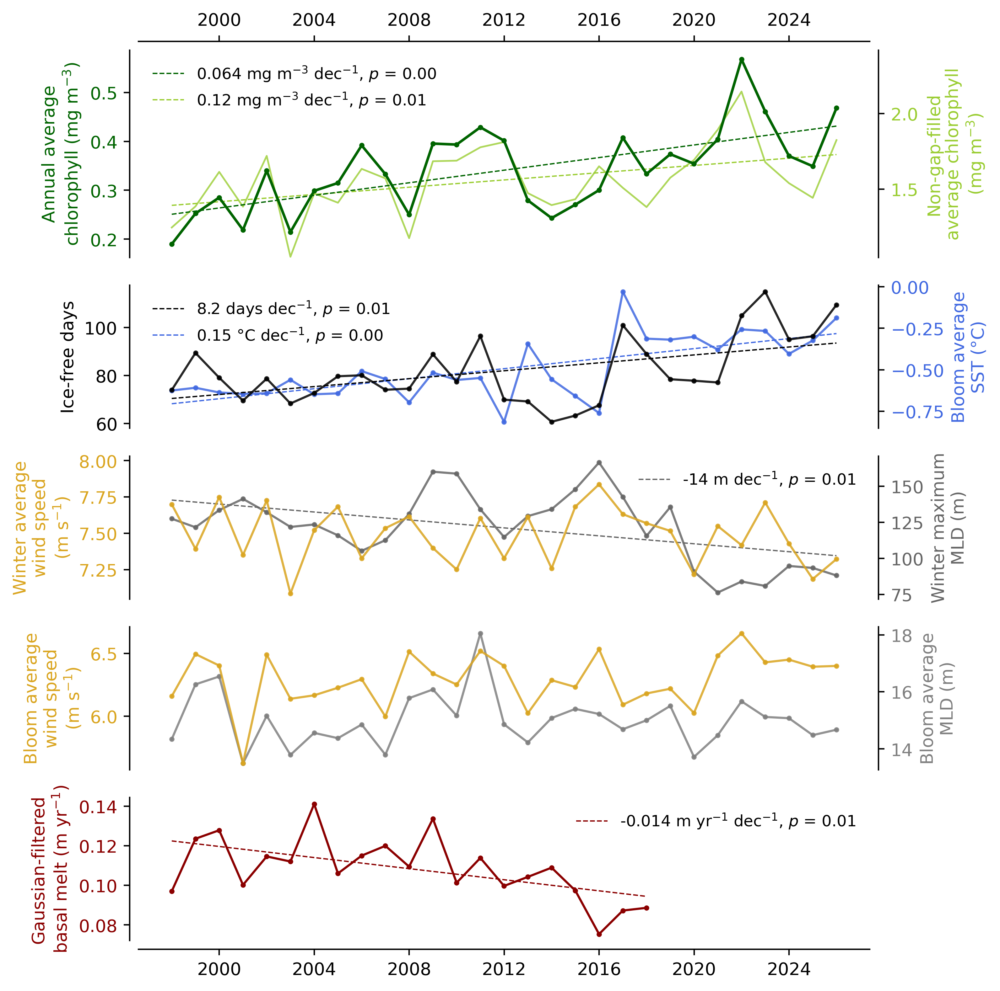

In [1284]:
# function to shift time axis to represent center of each quarter (listed dates represent the end dates of each quarter)
def shift_time(ds,shift_days=30.44*6):
    return ds.assign_coords(time=(ds['time'] + pd.Timedelta(days=shift_days)))

# function to plot linear regression line if p < 0.05
def plot_linear(ax,ts,xlim,c,units):
    m, b, r, p, std, dt_numeric = linear(ts)
    if p < 0.05:
        y_values = (m * dt_numeric) + b
        line, = ax.plot(ts['time'],y_values,c=c,lw=0.75,ls='--',label=f'{(m*365*10):.2g} {units} ' + 'dec$^{-1}$, $p$ = ' + f'{p:.2f}')
        return line
    return None

# plot
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(figsize=(8,8),nrows=5,ncols=1,gridspec_kw={'height_ratios':[1.45,1,1,1,1]},facecolor='w',dpi=400)

# panel (a)
color = 'darkgreen'
shift_time(ts_chl_annual_averages).plot(ax=ax1,c=color,lw=1.5,marker='o',ms=2)
ax1.set_ylabel('Annual average\nchlorophyll (mg m$^{-3}$)',color=color)
ax1.set_xlabel('')
ax1.tick_params(axis='y',labelcolor=color)
ax1.tick_params(axis='x',top=True,bottom=False,labeltop=True,labelbottom=False)
xlim = ax1.get_xlim()
line = plot_linear(ax1,shift_time(ts_chl_annual_averages),xlim,color,'mg m$^{-3}$')
ax1.set_xlim(xlim)
ax1.set_ylim([ax1.get_ylim()[0]*0.95,ax1.get_ylim()[1]])
drop_spines(ax=ax1,left=True,hide_bottom=True)
ax1_twin = ax1.twinx()
color = 'yellowgreen'
shift_time(ts_chl_non_zero_filled_annual_averages).plot(ax=ax1_twin,c=color,lw=1.0,alpha=0.8)
line_twin = plot_linear(ax1_twin,shift_time(ts_chl_non_zero_filled_annual_averages),xlim,color,'mg m$^{-3}$')
ax1_twin.set_xlim(xlim)
ax1_twin.set_ylim([ax1_twin.get_ylim()[0]*1.05,ax1_twin.get_ylim()[1]*1.1])
ax1_twin.set_ylabel('Non-gap-filled\naverage chlorophyll\n(mg m$^{-3}$)',color=color)
ax1_twin.set_xlabel('')
ax1_twin.tick_params(axis='y',labelcolor=color)
ax1_twin.tick_params(axis='x',top=True,bottom=False,labeltop=True,labelbottom=False)
drop_spines(ax=ax1_twin,left=False,hide_bottom=True)
ax1.set_zorder(ax1_twin.get_zorder() + 1)
ax1.patch.set_visible(False)
ax1.spines['top'].set_visible(True)
ax1.spines['top'].set_position(('outward',5))
ax1.legend(handles=[ha for ha in [line,line_twin] if ha is not None],frameon=False,fontsize=9)

# panel (b)
color = 'k'
shift_time(ts_ice_free_days).plot(ax=ax2,c='k',lw=1.25,marker='o',ms=2,alpha=0.85)
line = plot_linear(ax2,shift_time(ts_ice_free_days),xlim,color,'days')
ax2.set_xlim(xlim)
ax2.set_ylabel('Ice-free days')
ax2.set_xlabel('')
ax2.tick_params(axis='x',bottom=False,labelbottom=False)
drop_spines(ax=ax2,left=True,hide_bottom=True)
ax2_twin = ax2.twinx()
color = 'royalblue'
shift_time(ts_sst_bloom_averages).plot(ax=ax2_twin,c=color,lw=1.25,marker='o',ms=2,alpha=0.85)
line_twin = plot_linear(ax2_twin,shift_time(ts_sst_bloom_averages),xlim,color,'°C')
ax2_twin.set_xlim(xlim)
ax2_twin.set_ylabel('Bloom average\nSST (°C)',color=color)
ax2_twin.set_xlabel('')
ax2_twin.tick_params(axis='y',labelcolor=color)
ax2_twin.tick_params(axis='x',bottom=False,labelbottom=False)
drop_spines(ax=ax2_twin,left=False,hide_bottom=True)
ax2.set_zorder(ax2_twin.get_zorder() + 1)
ax2.patch.set_visible(False)
ax2.legend(handles=[ha for ha in [line,line_twin] if ha is not None],frameon=False,fontsize=9)

# panel (c)
color = 'goldenrod'
shift_time(ts_ws10_winter_averages).plot(ax=ax3,c=color,lw=1.25,marker='o',ms=2,alpha=0.85)
line = plot_linear(ax3,shift_time(ts_ws10_winter_averages),xlim,color,'m s$^{-1}$')
ax3.set_xlim(xlim)
ax3.set_ylim([ax3.get_ylim()[0],1.02*ax3.get_ylim()[1]])
ax3.set_ylabel('Winter average\nwind speed\n(m s$^{-1}$)',color=color)
ax3.set_xlabel('')
ax3.tick_params(axis='y',labelcolor=color)
ax3.tick_params(axis='x',bottom=False,labelbottom=False)
drop_spines(ax=ax3,left=True,hide_bottom=True)
ax3_twin = ax3.twinx()
color = '0.4'
shift_time(ts_mld_winter_maximums).plot(ax=ax3_twin,c=color,lw=1.25,marker='o',ms=2,alpha=0.85)
line_twin = plot_linear(ax3_twin,shift_time(ts_mld_winter_maximums),xlim,color,'m')
ax3_twin.set_xlim(xlim)
ax3_twin.set_ylabel('Winter maximum\nMLD (m)',color=color)
ax3_twin.set_xlabel('')
ax3_twin.tick_params(axis='y',labelcolor=color)
ax3_twin.tick_params(axis='x',bottom=False,labelbottom=False)
drop_spines(ax=ax3_twin,left=False,hide_bottom=True)
ax3.set_zorder(ax3_twin.get_zorder() + 1)
ax3.patch.set_visible(False)
ax3.legend(handles=[ha for ha in [line,line_twin] if ha is not None],frameon=False,fontsize=9,loc='upper right')

# panel (d)
color = 'goldenrod'
shift_time(ts_ws10_bloom_averages).plot(ax=ax4,c=color,lw=1.25,marker='o',ms=2,alpha=0.85)
line = plot_linear(ax4,shift_time(ts_ws10_bloom_averages),xlim,color,'m s$^{-1}$')
ax4.set_xlim(xlim)
ax4.set_ylabel('Bloom average\nwind speed\n(m s$^{-1}$)',color=color)
ax4.set_xlabel('')
ax4.tick_params(axis='y',labelcolor=color)
ax4.tick_params(axis='x',bottom=False,labelbottom=False)
drop_spines(ax=ax4,left=True,hide_bottom=True)
ax4_twin = ax4.twinx()
color = '0.5'
shift_time(ts_mld_bloom_averages).plot(ax=ax4_twin,c=color,lw=1.25,marker='o',ms=2,alpha=0.85)
line_twin = plot_linear(ax4_twin,shift_time(ts_mld_bloom_averages),xlim,color,'m')
ax4_twin.set_xlim(xlim)
ax4_twin.set_ylabel('Bloom average\nMLD (m)',color=color)
ax4_twin.set_xlabel('')
ax4_twin.tick_params(axis='y',labelcolor=color)
ax4_twin.tick_params(axis='x',bottom=False,labelbottom=False)
drop_spines(ax=ax4_twin,left=False,hide_bottom=True)
ax4.set_zorder(ax4_twin.get_zorder() + 1)
ax4.patch.set_visible(False)
ax4.legend(handles=[ha for ha in [line,line_twin] if ha is not None],frameon=False,fontsize=9)

# panel (e)
color = 'darkred'
shift_time(ts_basal_melt_bloom_averages).plot(ax=ax5,c=color,lw=1.25,marker='o',ms=2)
line = plot_linear(ax5,shift_time(ts_basal_melt_bloom_averages),xlim,color,'m yr$^{-1}$')
ax5.set_xlim(xlim)
ax5.set_ylabel('Gaussian-filtered\nbasal melt (m yr$^{-1}$)',color=color)
ax5.set_xlabel('')
ax5.tick_params(axis='y',labelcolor=color)
drop_spines(ax=ax5,left=True)
ax5.legend(frameon=False,fontsize=9)

plt.tight_layout()

# export
plt.savefig(data_dir_results + 'fig2.pdf',bbox_inches='tight')

## Figure 3: spatial correlations

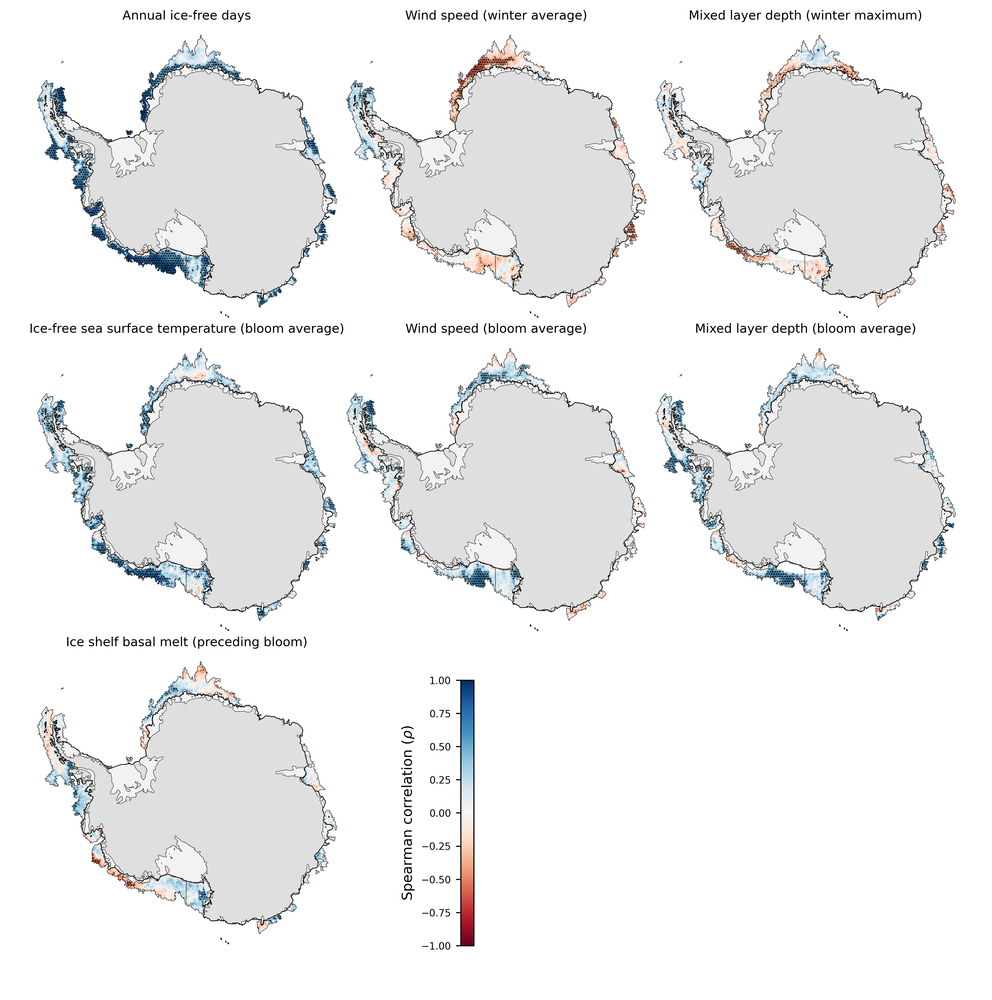

In [1285]:
# plotting function for spatial correlations
def corr_subplot(ax,ds,name):
    setup_map(ax,remove_labels=True,continent_only=True,land_color=0.875)
    r = ds[f'r_{name}']
    p = ds[f'p_{name}']
    pcm = r.plot(ax=ax,cmap='RdBu',vmin=-1.0,vmax=1.0,add_colorbar=False,
                 transform=ccrs.PlateCarree(),zorder=1) 
    p.plot.contourf(ax=ax,levels=[0,0.05],colors='none',hatches=['.......',None],add_colorbar=False,
                    transform=ccrs.PlateCarree(),zorder=1)
    bloom_mask.plot.contour(ax=ax,levels=[0.5],colors='k',linewidths=0.35,transform=ccrs.PlateCarree(),alpha=0.8,zorder=1)
    ax.set_title(ds[f'r_{name}'].attrs['predictor_name_long'],fontsize=9,y=0.95)
    return pcm

def add_cbar(ax,pcm):
    ax.axis('off')    # removes empty circular plot in axes created for colorbar
    cax = ax.inset_axes([0.4,0.0,0.25,1.0])
    cax.axis('off')
    cbar = plt.colorbar(pcm,ax=cax,orientation='vertical',location='left',shrink=0.9)
    cbar.ax.tick_params(labelsize=7)
    cbar.set_label(r'Spearman correlation ($\rho$)')

# create plot
nrows = 3; ncols = 3; figsize = (12.5,13.5)
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,subplot_kw={'projection':ccrs.SouthPolarStereo()},
                        gridspec_kw=dict(wspace=-0.125,hspace=-0.25),
                        figsize=figsize,facecolor='w',dpi=400)   # for gridspec_kw: width_ratios=np.append(np.tile(1,ncols-1),0.16))
                                                                 # originally with boundaries: wspace=0.02,hspace=0.17
axs = axs.flatten()

# spatial correlation subplots
pcm = corr_subplot(axs[0],chl_corrs,'ice_free_days')
pcm = corr_subplot(axs[1],chl_corrs,'ws10_winter')
pcm = corr_subplot(axs[2],chl_corrs,'mld_max_winter')
pcm = corr_subplot(axs[3],chl_corrs,'sst_bloom')
pcm = corr_subplot(axs[4],chl_corrs,'ws10_bloom')
pcm = corr_subplot(axs[5],chl_corrs,'mld_bloom')
pcm = corr_subplot(axs[6],chl_corrs,'basal_melt')
add_cbar(axs[7],pcm)
axs[8].axis('off')

# export
plt.savefig(data_dir_results + 'fig3.jpg',bbox_inches='tight')

## Figure 4: average chlorophyll vs. correlations

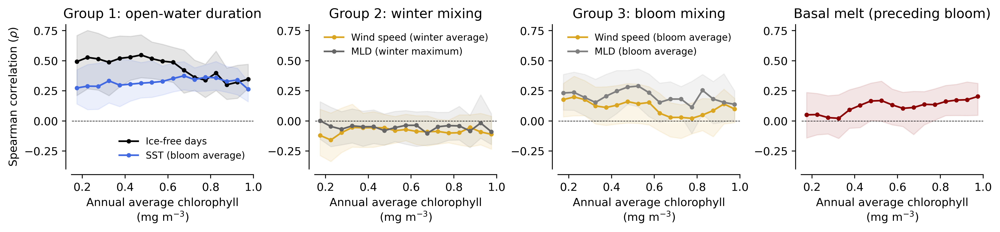

In [1297]:
# average chlorophyll vs. predictor correlations, binned over all grid cells
chl_flat = chl_average['chlor_a'].stack(grid_cells=('lat','lon'))
chl_flat_valid_mask = ~chl_flat.isnull().compute()
chl_bins = np.linspace(0.15,1.0,18)
chl_centers = (chl_bins[:-1] + chl_bins[1:]) / 2

# grid cell weights, varying by latitude
lat_grid, _ = xr.broadcast(chl_average['lat'],chl_average)
lat_flat = lat_grid.stack(grid_cells=('lat','lon'))
lat_weights = np.cos(np.deg2rad(lat_flat))

# function to get around the inability to directly apply .weighted().groupby().function() to an xarray object
def weighted_quantile(group,mask,q):
    weights = lat_weights[mask].sel(grid_cells=group['grid_cells'])
    return group.weighted(weights).quantile(q)

plt.figure(figsize=(12.5,3),facecolor='w',dpi=400)
var_names = [['r_ice_free_days','r_sst_bloom'],['r_ws10_winter','r_mld_max_winter'],['r_ws10_bloom','r_mld_bloom'],['r_basal_melt']]
var_labels = [['r_ice_free_days','r_sst_bloom'],['r_ws10_winter','r_mld_max_winter'],['r_ws10_bloom','r_mld_bloom'],['r_basal_melt']]
subplot_titles = ['Group 1: open-water duration','Group 2: winter mixing','Group 3: bloom mixing','Basal melt (preceding bloom)']
colors = [['k','royalblue'],['goldenrod','0.4'],['goldenrod','0.5'],['darkred']]
for subplot_idx, subplot_names in enumerate(var_names):
    plt.subplot(1,4,subplot_idx+1)
    plt.plot([0.0,1.0],[0.0,0.0],c='k',lw=0.5,ls='--')
    for var_idx, var_name in enumerate(subplot_names):
        r_predictor_flat = chl_corrs[var_name].stack(grid_cells=('lat','lon'))
        valid_mask = np.logical_and(chl_flat_valid_mask,~r_predictor_flat.isnull()).compute()
        chl_bin_nums = xr.DataArray(np.digitize(chl_flat[valid_mask].values,chl_bins),dims='grid_cells')
        r_predictor_median = r_predictor_flat[valid_mask].groupby(chl_bin_nums).map(weighted_quantile,mask=valid_mask,q=0.5)
        r_predictor_iqr = r_predictor_flat[valid_mask].groupby(chl_bin_nums).map(weighted_quantile,mask=valid_mask,q=[0.25,0.75])
        r_bin_median = r_predictor_median.sel(group=slice(1,len(chl_bins)-1)).values
        r_bin_iqr_25 = r_predictor_iqr.sel(quantile=0.25,group=slice(1,len(chl_bins)-1)).values
        r_bin_iqr_75 = r_predictor_iqr.sel(quantile=0.75,group=slice(1,len(chl_bins)-1)).values
        plt.fill_between(chl_centers,r_bin_iqr_25,r_bin_iqr_75,color=colors[subplot_idx][var_idx],alpha=0.10,zorder=1)
        plt.plot(chl_centers,r_bin_median,'-o',c=colors[subplot_idx][var_idx],ms=3,
                 label=f'{chl_corrs[var_name].attrs['predictor_name_short']}',zorder=2)
        plt.xlim([0.15,1.0])
        plt.ylim([-0.4,0.8])
        if   subplot_idx == 0:     plt.legend(frameon=False,fontsize=8.5,loc='lower right')
        elif subplot_idx in [1,2]: plt.legend(frameon=False,fontsize=8.5,loc='upper right')
        plt.title(subplot_titles[subplot_idx])
        plt.xlabel('Annual average chlorophyll\n' + r'(mg m$^{-3}$)')
        if subplot_idx == 0: plt.ylabel(r'Spearman correlation ($\rho$)');
        drop_spines()
plt.tight_layout()

# export
plt.savefig(data_dir_results + 'fig4.pdf',bbox_inches='tight')

## Figure S1: CDW residence time on shelf

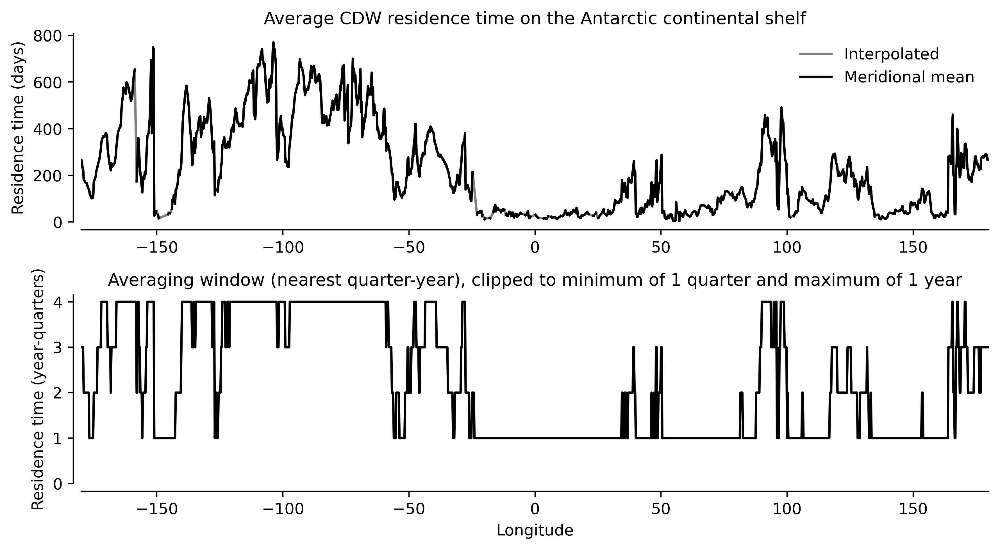

In [741]:
# CDW residence time on the shelf (meridionally-averaged, by longitude around Antarctica)
plt.figure(figsize=(9,5),facecolor='w',dpi=400)
plt.subplot(2,1,1)
tamsitt_meridional_mean.plot(c='0.5',label='Interpolated')
tamsitt_meridional_mean_with_nans.plot(c='k',label='Meridional mean')
plt.xlim([-180,180])
plt.ylim([0,None])
plt.legend(frameon=False,loc='upper right')
plt.xlabel('')
plt.ylabel('Residence time (days)')
plt.title('Average CDW residence time on the Antarctic continental shelf',fontsize=11)
drop_spines()
plt.subplot(2,1,2)
tamsitt_average_window_quarters.plot(c='k')
plt.xlim([-180,180])
plt.ylim([0,None])
plt.xlabel('Longitude')
plt.ylabel('Residence time (year-quarters)')
plt.title('Averaging window (nearest quarter-year), clipped to minimum of 1 quarter and maximum of 1 year',fontsize=11)
drop_spines()
plt.tight_layout()

# broadcast over latitude to create a gridded version
tamsitt_meridional_mean_gridded = xr.broadcast(tamsitt_meridional_mean,tamsitt_on_era5_grid['lat'])[0]
tamsitt_average_window_quarters_gridded = xr.broadcast(tamsitt_average_window_quarters,tamsitt_on_era5_grid['lat'])[0]

# export
plt.savefig(data_dir_results + 'supp_fig_residence_time_circumpolar.pdf',bbox_inches='tight')

## Figure S2: ice shelf basal melt time series

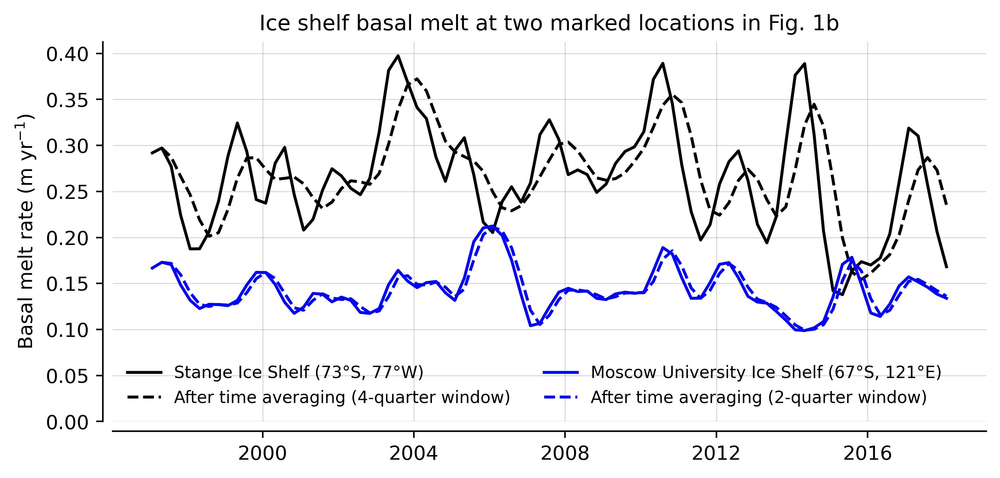

In [1287]:
# ice shelf basal melt at two marked locations in Fig. 1
#    (Stange Ice Shelf on Antarctic Peninsula and Moscow University Ice Shelf in East Antarctica), 
#    with and without location-dependent averaging based on CDW residence time

# function to shift time axis to represent center of each quarter (listed dates represent the end dates of each quarter)
def shift_time(ds,shift_days=-30.44*1.5):
    return ds.assign_coords(time=(ds['time'] + pd.Timedelta(days=shift_days)))
    
loc1 = [-77,-73]   # lon, lat
loc2 = [121,-67]
plt.figure(figsize=(8,3.5),facecolor='w',dpi=400)
sample_window_length_loc1 = tamsitt_average_window_quarters_gridded.sel(lat=loc1[1],lon=loc1[0],method='nearest').item()
shift_time(basal_melt_pos.sel(lat=loc1[1],lon=loc1[0],method='nearest')).plot(c='k',label=f'Stange Ice Shelf ({-1*loc1[1]}°S, {-1*loc1[0]}°W)')
shift_time(basal_melt_location_dependent_mean.sel(lat=loc1[1],lon=loc1[0],method='nearest')).plot(c='k',ls='--',label=f'After time averaging ({int(sample_window_length_loc1)}-quarter window)')
sample_window_length_loc2 = tamsitt_average_window_quarters_gridded.sel(lat=loc2[1],lon=loc2[0],method='nearest').item()
shift_time(basal_melt_pos.sel(lat=loc2[1],lon=loc2[0],method='nearest')).plot(c='b',label=f'Moscow University Ice Shelf ({-1*loc2[1]}°S, {loc2[0]}°E)')
shift_time(basal_melt_location_dependent_mean.sel(lat=loc2[1],lon=loc2[0],method='nearest')).plot(c='b',ls='--',label=f'After time averaging ({int(sample_window_length_loc2)}-quarter window)')
plt.ylim([0,None])
plt.legend(frameon=False,ncol=2,fontsize=8.5)
plt.grid(lw=0.5,alpha=0.5)
plt.ylabel('Basal melt rate (m yr$^{-1}$)')
plt.xlabel('')
plt.title('Ice shelf basal melt at two marked locations in Fig. 1b',fontsize=11)
drop_spines()

# export
plt.savefig(data_dir_results + 'supp_fig_basal_melt_time_series.pdf',bbox_inches='tight')